In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library

from skimage.feature import hog # Hog feature extractor

from sklearn.manifold import TSNE # TSNE function
import seaborn as sns # Plotting library

from sklearn.metrics import classification_report,accuracy_score # Metrics to evaluate the classifiers

#PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

#Classifiers
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm


<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red">r0874660, r0873235, r0874573, r0875139, r0874665</span>.

The goal of this assignment is to explore more advanced techniques for constructing features that better describe objects of interest and to perform face recognition using these features. This assignment will be delivered in groups of 5 (either composed by you or randomly assigned by your TA's).

In this assignment you are a group of computer vision experts that have been invited to ECCV 2021 to do a tutorial about  "Feature representations, then and now". To prepare the tutorial you are asked to participate in a kaggle competition and to release a notebook that can be easily studied by the tutorial participants. Your target audience is: (master) students who want to get a first hands-on introduction to the techniques that you apply.

---------------------------------------------------------------
This notebook is structured as follows:
0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion

Make sure that your notebook is **self-contained** and **fully documented**. Walk us through all steps of your code. Treat your notebook as a tutorial for students who need to get a first hands-on introduction to the techniques that you apply. Provide strong arguments for the design choices that you made and what insights you got from your experiments. Make use of the *Group assignment* forum/discussion board on Toledo if you have any questions.

Fill in your student numbers above and get to it! Good luck! 


<div class="alert alert-block alert-info">
<b>NOTE:</b> This notebook is just a example/template, feel free to adjust in any way you please! Just keep things organised and document accordingly!
</div>

<div class="alert alert-block alert-info">
<b>NOTE:</b> Clearly indicate the improvements that you make!!! You can for instance use titles like: <i>3.1. Improvement: Non-linear SVM with RBF Kernel.<i>
</div>
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [3]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [4]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [5]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 HAAR face detector
In this example we use the [HAAR feature based cascade classifiers](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one. 

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [6]:
class HAARPreprocessor():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=1.2,
            minNeighbors=5,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE
        )
        
    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""
        
        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])
        
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        # only return the first face
        return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
            
    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)

**Visualise**

Let's plot a few examples.

In [7]:
# parameter to play with 
FACE_SIZE = (100, 100)

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

    
#preprocessed data 
preprocessor = HAARPreprocessor(path = '../../tmp', face_size=FACE_SIZE)

train_X, train_y = preprocessor(train), train['class'].values
test_X = preprocessor(test)


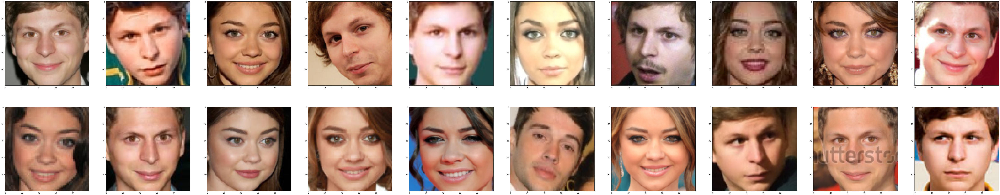

In [8]:
# plot faces of Michael and Sarah

plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)


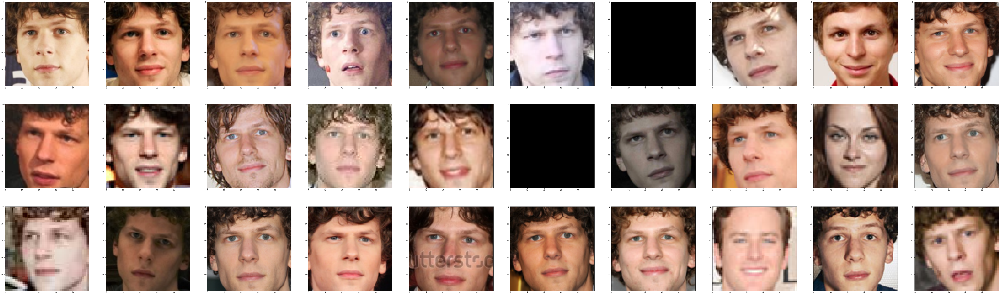

In [9]:
# plot faces of Jesse

plot_image_sequence(train_X[train_y == 1], n=30, imgs_per_row=10)

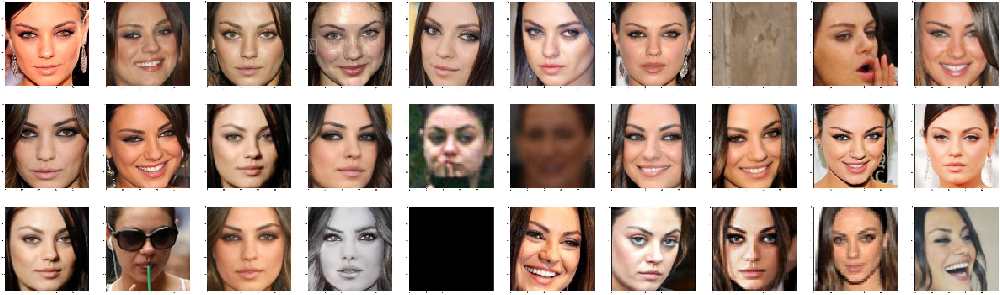

In [10]:
# plot faces of Mila

plot_image_sequence(train_X[train_y == 2], n=30, imgs_per_row=10)


**Filtering**

After obtaining the faces we have decided to filter those images that have been identified as faces but that are not such. For that purpose we have evaluated the standard variance of the images that we have obtained and eliminated those that do not have a value over 35.

In [11]:
#filter non useful images

train_x_filtered = []
labels_filtered = []
filtered = []

for i in range(train_X.shape[0]):
    std = np.std(train_X[i])
    if std > 35:
        train_x_filtered.append(train_X[i])
        labels_filtered.append(train_y[i])
    else: 
        filtered.append(train_X[i])
        
filtered.append(train_x_filtered[65])
filtered.append(train_x_filtered[45])
filtered.append(train_x_filtered[17])
#eliminate manually 3 pictures from training set in which jesse isn't jesse       
train_x_filtered.pop(65)
labels_filtered.pop(65)
train_x_filtered.pop(45)
labels_filtered.pop(45)
train_x_filtered.pop(17)
labels_filtered.pop(17)

train_x_filtered = np.array(train_x_filtered)
train_y_filtered = np.array(labels_filtered)
filtered = np.array(filtered)

Here we can observe the images that have been filtered from the faces array.

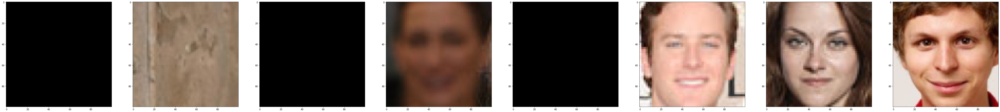

In [12]:
plot_image_sequence(filtered, n=filtered.shape[0], imgs_per_row=filtered.shape[0])

## 0.4. Store Preprocessed data (optional)
<div class="alert alert-block alert-info">
<b>NOTE:</b> You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". Feel free to use this to store intermediary results.
</div>

In [13]:
# save preprocessed data
# prep_path = '/kaggle/working/prepped_data/'
# if not os.path.exists(prep_path):
#     os.mkdir(prep_path)
    
# np.save(os.path.join(prep_path, 'train_X.npy'), train_X)
# np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
# np.save(os.path.join(prep_path, 'test_X.npy'), test_X)

# load preprocessed data
# prep_path = '/kaggle/working/prepped_data/'
# if not os.path.exists(prep_path):
#     os.mkdir(prep_path)
# train_X = np.load(os.path.join(prep_path, 'train_X.npy'))
# train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
# test_X = np.load(os.path.join(prep_path, 'test_X.npy'))

Now we are ready to rock!

# 1. Feature Representations

## 1.0. Example: Identify feature extractor
**Feature extraction consist in computing a feature descriptor, which is a representation of an image that contains only the useful information and gets rid of the rest.
The utility of the information is based on the purpose of image recognition by classification algorithms, in this particular case is based on the face recognition.**

Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [14]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transf(self, X):
        return X
    
    def __call__(self, X):
        return self.transf(X)
 
    
fExtractor = IdentityFeatureExtractor()

## 1.1. Baseline 1: HOG feature extractor/Scale Invariant Feature Transform
**Histogram of Oriented Gradient (also known as HOG) is a feature descriptor, that saves the information about the orientation and the gradient of the pixels of the object that needs to be identified. The main objective of a feature instructor is to represent the most important information in a compact form.**

Each of the gradient fires in the opposite sense, it means that x-gradiente will do it with the vertical lines and y-gradient with horizontal lines and their magnitude is related with the change of intensity. The idea is to keep just the most important information and delete the non-essential.

First of all, the images will be divided in cells. The number of pixels per cell is a design option, so for acquire the enough amount of interesting feature it was decided to take 8x8 pixels per cell.

Then, in order to calculate the dimension of HOG feature vector, it is known that the images are divided by 32x32 (64*4/8) cells so it means that there are 31 (32-1) horizontal and 31 (32-1) vertical positions making the result 961 positions.

Later, knowing that the block is 16x16 (4 cells, each of one 8x8), it can be represented as 36x1 vector (4 cells and 9 bins) and appending each of them in a single vector its dimesion is 34596 (916x36)

Continuously, histogram of gradients is created in the previous 8×8 cells and it contains 9 bins with angles 0, 20, 40, 60, 80, 100, 120, 140 and 160.

In [15]:

class HOGFeatureExtractor(IdentityFeatureExtractor):
    """TODO: this feature extractor is under construction"""
    
    def __init__(self):
        #Let data be an image array
        self.data = []
        #Let hogData be an array with all the hogData extracted from the histograms
        self.hogData = []
        #Let hogImages be an array of images with the hogData information ready to display
        self.hogImages = []
        #Let features be the information of the concatenated histograms
        self.hogFeatures = []
        
    def transf(self, X):
        self.data = []
        self.hogData = []
        self.hogImages = []
        self.hogFeatures = []
        for face in X:
            self.data.append(face)
            face = np.array(face, dtype='uint8')
            resizedFace = cv2.resize(face, (64*4, 64*4))
            #As we are taking 8x8 cells, we will divide the image in 32x32 (64*4/8)
            faceFeatures, hogFaceData = hog(resizedFace, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, channel_axis=2)
            hogFaceGray = cv2.normalize(hogFaceData, 0, 255, norm_type=cv2.NORM_MINMAX)
            hogFaceGray = np.uint8(np.around(hogFaceGray))
            hogFace = cv2.cvtColor(hogFaceGray, cv2.COLOR_GRAY2BGR)
            self.hogData.append(hogFaceData)
            self.hogImages.append(hogFace)
            self.hogFeatures.append(faceFeatures)
            
        self.hogFeatures=np.array(self.hogFeatures)
        
        return self.hogFeatures
    

Here it is defined a **class called HOGFeaturesExtractor** where initializes 4 different arrays (data, hogData, hogImages and hogFeatures)

*    *Data:* it accumulates all images in an array

*    *hogData:* it accumulates all the hogData extracted from the histograms

*    *hogImages:* It does not exist to create an easy way to visualize the HOG descriptor. Once hogImages is obtained, it is need to normalize its data and transform to gray in order to see the orientation and the gradient of the pixels of the image in a plot.

*    *hogFeatures:* it accumulates all the features of the images, that is to say the information of the concatenated histograms.

This class has transform function which, for every picture (face), will create the 4 previous arrays and return the HogFeatures. This array will be implemented in the following part of the code.

**Hog function:** The most importat part is the hogh function which has 6 inputs and 2 outputs.

*    *(Input) resizedFace:* the image which has been resized

*    *(Input) orientations=9:* design option (angles 0, 20, 40, 60, 80, 100, 120, 140 and 160)

*    *(Input) pixels_per_cell=(8, 8):* design option

*    *(Input) cells_per_block=(2, 2):* design option

*    *(Input) visualize=True:* in order to get an image of the HOG.

*    *(Input) channel_axis=2:* it indicates which axis of the array refers to channels

*    *(Output) faceFeatures:* HOG descriptor for the image. It will store the features for every face

*    *(Output) hogFaceData:* A visualisation of the HOG image. As it has been explained before, this will not be useful for coding, just for showing the faces after the hog is applied.

**Attempt to improve:** It was tried to change from 64x4 to 64x2 when the resize of an image was applied. The idea of this is to get an array of features smaller than the previous one in order to decrease the pre-processing time whereas the accuracy is maintained. In this case, the accuracy is not the same but also it decreases, being not a good improvement.


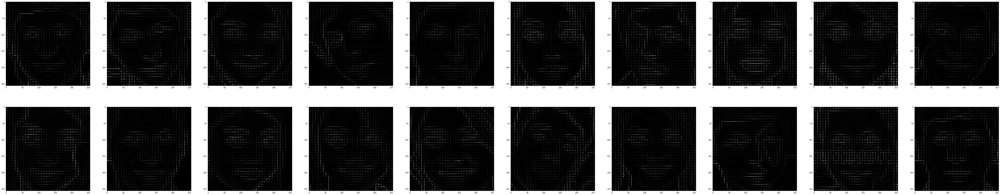

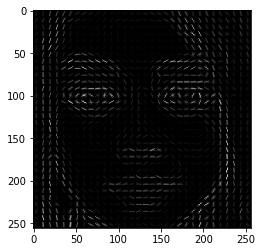

In [16]:
#Obtaining and plotting the features from the test data pictures of Michael and Sarah

testDataHOG0 = HOGFeatureExtractor()
testDataHOG0(train_x_filtered[train_y_filtered == 0])
plot_image_sequence(testDataHOG0.hogImages, n=train_x_filtered[train_y_filtered == 0].shape[0], imgs_per_row=10)

#Plotting the features of a random image of Michael and Sarah
n=np.random.randint(len(testDataHOG0.hogImages))
plt.imshow(testDataHOG0.hogImages[n])

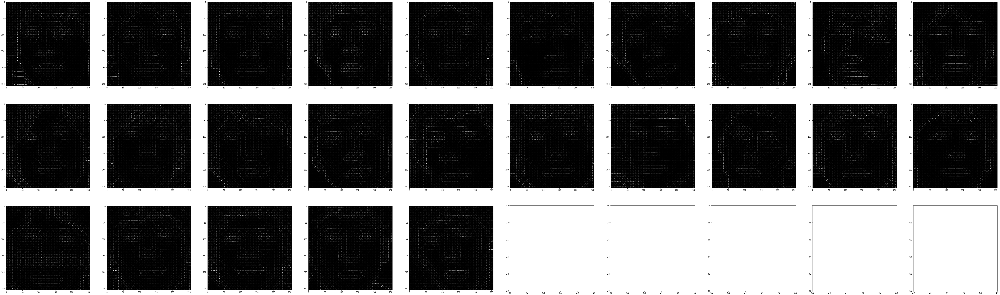

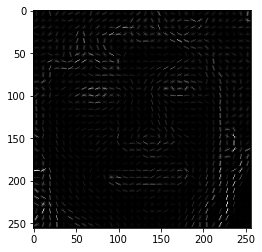

In [17]:
#Obtaining and plotting the features from the test data pictures of Jesse
testDataHOG1 = HOGFeatureExtractor()
testDataHOG1(train_x_filtered[train_y_filtered == 1])
plot_image_sequence(testDataHOG1.hogImages, n=train_x_filtered[train_y_filtered == 1].shape[0], imgs_per_row=10)

#Plotting the features of a random image of Jesse
n=np.random.randint(len(testDataHOG1.hogImages))
plt.imshow(testDataHOG1.hogImages[n])

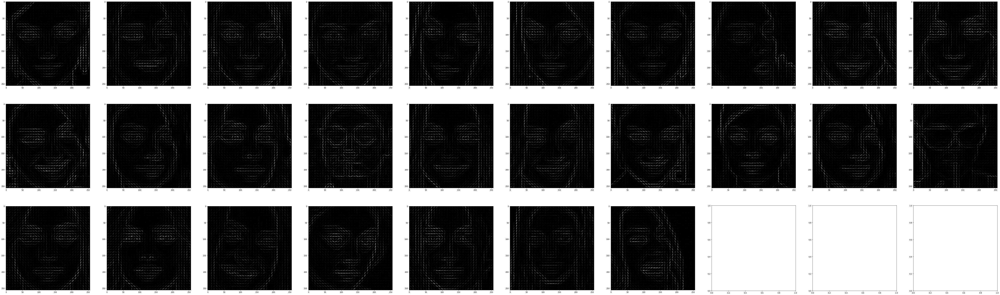

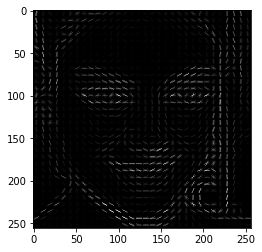

In [18]:
#Obtaining and plotting the features from the test data pictures of Mila
testDataHOG2 = HOGFeatureExtractor()
testDataHOG2(train_x_filtered[train_y_filtered == 2])
plot_image_sequence(testDataHOG2.hogImages, n=train_x_filtered[train_y_filtered == 2].shape[0], imgs_per_row=10)

#Plotting the features of a random image of Mila
n=np.random.randint(len(testDataHOG2.hogImages))
plt.imshow(testDataHOG2.hogImages[n])

### 1.1.1. t-SNE Plots
**The t-Distributed Stochastic Neighbor Embedding most known as t-SNE is a technique which is used to visualize high-dimensional data when a 2D or 3D map with each point is given. In simpler terms, the main objective is to represent high-dimensional data in a lower dimension in order to know the data is arranged in the high-dimensional space.**

The t-SNE algorithm creates a probability distribution that represents the similarities between neighbours of the high-dimensional and low-dimensional space. It works in such a way that similar points (the ones with have lower distance between them) will have higher probability while non-similar points will have lower.

The idea is to recreate the high-dimensional distribution from the original space in the low-dimensional space minimizing the differences between the two probability distributions.

In [19]:
#get an array with all the features from the 80 different faces
testDataHOG = HOGFeatureExtractor()
testDataHOG(train_x_filtered)

#especify the dimension of the embedded space
tsne = TSNE(n_components=2, learning_rate='auto', init='random')

#transformation from bigger space to 2 dimensional space
tsne_result = tsne.fit_transform(np.array(testDataHOG.hogFeatures))
#dimensions are (80,2) = (faces tested, n_components)

#save the resulting components of tsne with the labels in a dataframe
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1], 'label': train_y_filtered})



**tSNE class:** A importat part is the tSNE class which has 3 inputs and creates an object.

*     *(Input) n_components=2:* Dimension of the embedded space.

*     *(Input) learning_rate='auto':* If it is high, the date might look like a 'ball' approximately equidistant from its nearest neighbours whereas if it is low, the data points might look like compressed in a dense cloud.

*     *(Input) init='random':* Initialization of embedding. This random initialization causes that every time the code is run, the plot is different but the classes (0, 1 and 2) are clearly shown.

*     *(Output) tsne:* the name of the created object.

**fit_transform function:** tSNE class has this function which fits *np.array(testDataHOG.hogFeatures)* into an embedded space and return that transformed output. In simpler terms, it transforms from the bigger space to 2 dimensional space. tsne_result is an array that its dimensions are 80x2 (80 faces tested and 2 dimensions).

After that, the result is saved in a dataframe with its corresponding labels (class 0, 1 or 2) in order to be able to plot the classes in the 2-dimensional space.

849


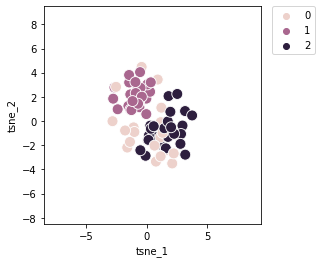

In [20]:
#T-SNE plot
fig, ax = plt.subplots(1)
sns.scatterplot(x ='tsne_1', y='tsne_2', hue='label', data=tsne_result_df, ax=ax,s=120)
lim = (tsne_result.min()-5, tsne_result.max()+5)
ax.set_xlim(lim)
ax.set_ylim(lim)
ax.set_aspect('equal')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
print(tsne.n_iter_)

In the plot, t-SNE will be able to group together the similar faces and separate the different ones. For that, the class 1 faces will be together, class 2 faces will be together and 0 class faces (which are neither class 1 nor 2) will be dispersed around the plot.

### 1.1.2. Discussion
Even though the random initialization makes the plot different each time, we can always see the same patterns: 

* The cluster composed by the purple points (associated to the features from Jesse) is clearly separated from the cluster composed by the black points (associated to the features from Mila)
* The points from the features from the 0 class are spread out between the two other clusters.

These results make sense because of the ressemblance between Michael and Jesse and between Sarah and Mila, that makes the features similar between these pairs.

## 1.2. Baseline 2: PCA feature extractor


### 1.2.1. Introduction

**Another approach to extract features is from the training data, which can be performed with Principal Component Analysis (PCA). This technique reduces the huge dimensionality of the raw features from the training faces without losing important information in the process.**

The outputs of the PCA technique are called eigenfaces. The **eigenfaces** are the eigenvectors of the covariance matrix of all the training images, whose direction shows the maximum variance in the training set. The **eigenvalues** of the eigenvectors express how much variance there is in the direction of the eigenvector, i.e., how much information the eigenvector contains after the dimensionality reduction.

The goal is to retain the eigenfaces with the largest eigenvalues, to reduce dimensionality and still accurately represent the dataset.

These are the steps followed to compute the technique:

    1. Create a 2D matrix with the training set. A flatten operation must be performed on each image.

    2. Center the 2D matrix by subtracting the average image.

    3. Calculate the eigenfaces and eigenvectors of the covariance matrix.

    4. Choose the number of principal components that are retained. To do so, the eigenvectors are sorted in a descending order, keeping the most representative ones at the beginning.

### 1.2.2. Definition of the class

We have create the class PCAFeatureExtractor() that guides us in the process of extracting the relevant features with which we are going to train the models. The images must be the same size, so the input of this class is the cropped training images of size FACE_SIZE as input.

The PCA technique is performed in several steps using the nine functions belonging to the class we have created:

- *create_matrix*

The input of the PCA has to be a 2D matrix, so the first step is to "flatten" each image of size NxN in order to be represented as a N² x 1 vector. Then, a matrix of the entire training set is created by concatenating all these vectors. The matrix is going to have the shape (number of examples in the training set x (image height x image width)). This is performed by the create_matrix function, which converts to grayscale so that only one channel is retained, followed by a reshape() operation.

- *calculate_metrics_faces*

The average face and the standard deviation face are computed by calculating the mean and standard deviation of each row of the matrix (pixel-wise operations). Each one returns a single vector of the same size than the images, that represents both the average face and the standard deviation face of the whole training set. We are going to use these faces in the calculation of the reconstruction of the training images afterwards.

- *extract_centered_matrix*

As the PCA technique requires centered points, the data is transformed in order to obtain the centered matrix by subtracting the mean of the column from each entry, to ensure that each column has a 0 mean.

- *transf*

Computes the covariance matrix. Here the data is projected on the eigenfaces orthonormal basis (x_train_pca).

- *plot_variances*

Plots the variances to give an insight of how much information is retained by each principal component.

- *plot_singular_values*

Plots the singular values.

- *inverse_transf*

Every face can be reconstructed as a linear combination of the most representative eigenvectors. In order to do so, this function scales back the data to its original representation. Each image is reconstructed by the mean and standard deviation face (previously calculated) and the inverse transformation of x_train_pca.

- *plot_all_reconstructed*

The image is shown after the reconstruction.

- *plot_eigenfaces*

Plots the eigenfaces by a simple reshape operation.

In [21]:
class PCAFeatureExtractor(IdentityFeatureExtractor):
    """TODO: this feature extractor is under construction"""
    
    def __init__(self, n_components, face_size):
        self.n_components = n_components
        self.face_size = face_size
        #self.avg_face_img, self.std_face_img = self.calculate_metrics_faces()
        #self.centered_matrix = self.extract_centered_matrix()
        
           
    def create_matrix(self,train_X):
        matrix = train_X
        full_matrix = []

        for i in range(matrix.shape[0]):
            img = np.uint8(matrix[i,:,:,:])
            img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            img = img_gray.flatten()
            full_matrix.append(img)
    
        full_matrix = np.array(full_matrix) 
        self.matrix=full_matrix
        return self.matrix
    
    
    def calculate_metrics_faces(self,matrix):
        avg_face = np.reshape(matrix.mean(0),self.face_size)
        std_face = np.reshape(matrix.std(0),self.face_size)
        
        return avg_face, std_face
    
      
    def extract_centered_matrix(self, matrix):
        avg_vector = matrix.mean(0)
        centered_matrix = matrix - avg_vector
        
        return centered_matrix

    def transf(self,train_X):
        matrix = self.create_matrix(train_X)
        centered_matrix = self.extract_centered_matrix(matrix)
        self.calculate_metrics_faces(matrix)
        
        scaler = StandardScaler()
        x_train = scaler.fit_transform(centered_matrix)
        
        # Fit the model
        pca = PCA(n_components = self.n_components, svd_solver="randomized",whiten=True).fit(x_train)
        self.pca=pca
        self.singular_values = pca.singular_values_

        # Projecting the input data on the eigenfaces orthonormal basis
        x_train_pca = pca.transform(x_train)
        
        # Extract the eigenfaces
        self.eigenfaces = pca.components_
        
        # Extract the variance ratio 
        self.variances = pca.explained_variance_ratio_
        
        return x_train_pca
        
    def plot_variances(self,variances):
        n_components_list = list(range(1,self.n_components + 1))
        plt.bar(n_components_list,list(variances)); 
        plt.xlabel("principal component #", size=10)
        plt.ylabel("Ratio of variance", size=10)
        plt.title("Ratio of variance")
    
    def plot_singular_values(self,singular_values):
        n_components_list = list(range(1,self.n_components + 1))
        plt.bar(n_components_list,list(singular_values)); 
        plt.xlabel("principal component #", size=10)
        plt.ylabel("Singular values", size=10)
        plt.title("Singular values")
    
    
    def inverse_transf(self, x_train_pca):
        """Scale back the data to the original representation (reconstruct the images)"""
        # Retrieve average and std face images for reconstruction
        matrix = self.matrix
        avg_face = np.reshape(matrix.mean(0),self.face_size)
        std_face = np.reshape(matrix.std(0),self.face_size)
        
        # Run inverse transform
        faces_inverse = self.pca.inverse_transform(x_train_pca) 
        #(nb_train_examplesx mn) being mn total pixels of photo(m cols x n rows of image)

        reconstructed_imgs = []
        for i in range(faces_inverse.shape[0]):
            r_img = np.reshape(faces_inverse[i,:],self.face_size)
            r_img = avg_face + std_face * r_img
            reconstructed_imgs.append(r_img)

        # Plot a random original photo from train set and its reconstructed one
        n = np.random.randint(0,len(reconstructed_imgs))

        fig = plt.figure(figsize=(15, 5))
        fig.add_subplot(1, 2, 1)
        plt.imshow(np.reshape(matrix[n,:],self.face_size),cmap="gray")
        plt.title("Random original photo")
        fig.add_subplot(1, 2, 2)
        reconstructed_imgs = np.array(reconstructed_imgs)
        plt.imshow(np.reshape(reconstructed_imgs[n,:],self.face_size),cmap="gray")
        plt.title("Reconstructed photo");
        
        return reconstructed_imgs
        
    def inverse_transf_plot(self, x_train_pca):
        """Scale back the data to the original representation (reconstruct the images)"""
        # Retrieve average and std face images for reconstruction
        matrix = self.matrix
        avg_face = np.reshape(matrix.mean(0),self.face_size)
        std_face = np.reshape(matrix.std(0),self.face_size)
        
        # Run inverse transform
        faces_inverse = self.pca.inverse_transform(x_train_pca) 
        #(nb_train_examplesx mn) being mn total pixels of photo(m cols x n rows of image)

        reconstructed_imgs = []
        for i in range(faces_inverse.shape[0]):
            r_img = np.reshape(faces_inverse[i,:],self.face_size)
            r_img = avg_face + std_face * r_img
            reconstructed_imgs.append(r_img)

        reconstructed_imgs = np.array(reconstructed_imgs)
        
        
        return reconstructed_imgs
    
    
    def plot_all_reconstructed(self,reconstructed_imgs):
        reconstructed_imgs = list(reconstructed_imgs)
        plot_image_sequence(reconstructed_imgs, n=len(reconstructed_imgs), imgs_per_row=10)   
        
        
    def plot_eigenfaces(self,eigenfaces):
        #print(eigenfaces.shape) #n_comps eigenfaces x shape of image (e.g. (10 PCs, 10000) if 100x100 images)
        list_eigenfaces = [] #list to save reshaped eigenfaces(images)

        for i in range(self.n_components):
            eig = eigenfaces[i,:]
            maxi = np.max(eig)
            mini = np.min(eig)
            eig = ((eig - mini) / (maxi-mini)*255).astype("uint8") #norm
            eig = np.reshape(eig,self.face_size)
            list_eigenfaces.append(eig)

        print("Number of eigenfaces:",len(list_eigenfaces))
        plot_image_sequence(list_eigenfaces, n=len(list_eigenfaces), imgs_per_row=10)
    

### 1.2.3. Optimal value of the number of principal components

The optimal value of the number of principal components must retain a percentage of the information that is **representative** and at the same time significantly **reduces the dimensionality** of the problem. Therefore, a trade-off between information and dimensionality has to be found.

The number of components has to be less than the number of training images. The initial size of the training set was 80, but with the filtering preprocessing decreases to 76. Therefore, the maximum number of components that can be chosen is 76.

In order to find out what is the optimal number of principal components, we have plotted all components in terms of the variance ratio. As can be seen, from 10 onwards, the information added decreases considerably. Therefore, the PCA technique will be carried out with a total of 10 principal components. These 10 components retain 69.9% of the total information (as shown below), which we consider a good proportion to be able to perform the technique with good results.

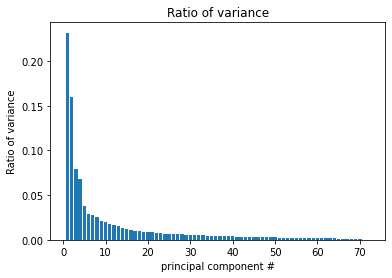

In [22]:
# See optimal n_comps
PCA_all = PCAFeatureExtractor(train_x_filtered.shape[0],FACE_SIZE)
PCA_all(train_x_filtered);
PCA_all.plot_variances(PCA_all.variances)

### 1.2.4. PCA Implementation with 10 components

First of all, an object 'obj' of the class PCFeatureExtractor() is created with the 10 optimal components and the FACE_SIZE.

In [23]:
# With 10 PCs 
obj = PCAFeatureExtractor(10,FACE_SIZE)
x_train_pca = obj(train_x_filtered);


The reshaped matrix is then centered. A random image is shown in comparison with its centered face.

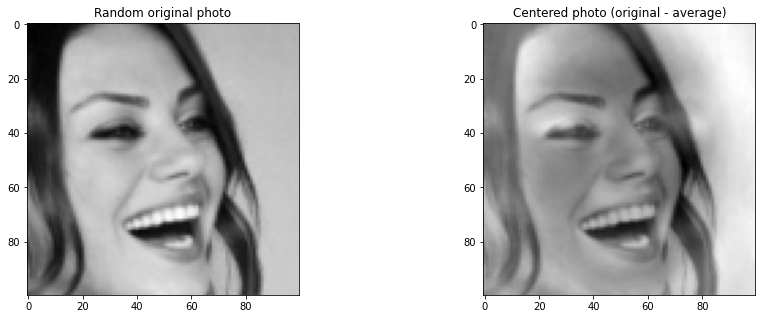

In [24]:
#Plot random original face and its centered face (original - average)
matrix = obj.create_matrix(train_x_filtered)
centered_matrix = obj.extract_centered_matrix(matrix)

n = np.random.randint(0,matrix.shape[0])
fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1, 2, 1)
plt.imshow(np.reshape(matrix[n,:],FACE_SIZE),cmap="gray");
plt.title("Random original photo");

fig.add_subplot(1, 2, 2)
plt.imshow(np.reshape(centered_matrix[n,:],FACE_SIZE),cmap="gray");
plt.title("Centered photo (original - average)");

The mean and standard deviation are calculated. A random average face is shown in comparison with its standard deviation face.

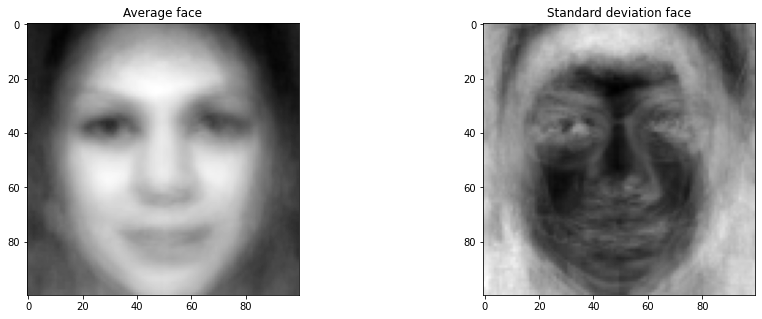

In [25]:
avg_face, std_face = obj.calculate_metrics_faces(matrix)
fig = plt.figure(figsize=(15, 5))
fig.add_subplot(1, 2, 1)
plt.imshow(avg_face,cmap="gray");
plt.title("Average face")
fig.add_subplot(1, 2, 2)
plt.imshow(std_face,cmap="gray");
plt.title("Standard deviation face");

As mentioned above, it is retained the 69,9% of the original information, being mostly concentrated in the 5 principal components:

Percentage of used information: 0.6989988951311056


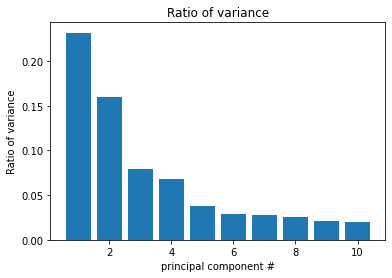

In [26]:
obj.plot_variances(obj.variances)
print("Percentage of used information:",np.sum(obj.variances))

Here, the eigenvalues are plotted. As can be seen, its value decreases as the number of components increases, as the first ones are the most informative.

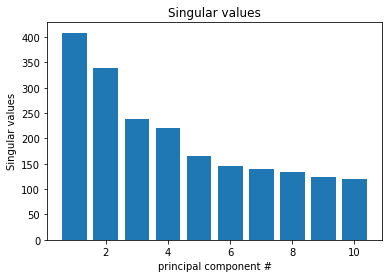

In [27]:
obj.plot_singular_values(obj.singular_values)

A random image is then reconstructed as a linear combination of the most representative eigenfaces.

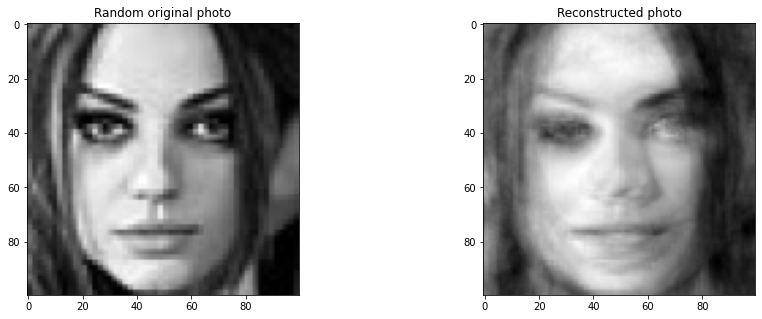

In [28]:
reconstructed_imgs = obj.inverse_transf(x_train_pca);

In [29]:
# Plot training faces reconstructed
#obj.plot_all_reconstructed(reconstructed_imgs)

Here one face is reconstructed using gradually more eigenfaces, until the face is completely reconstructed.

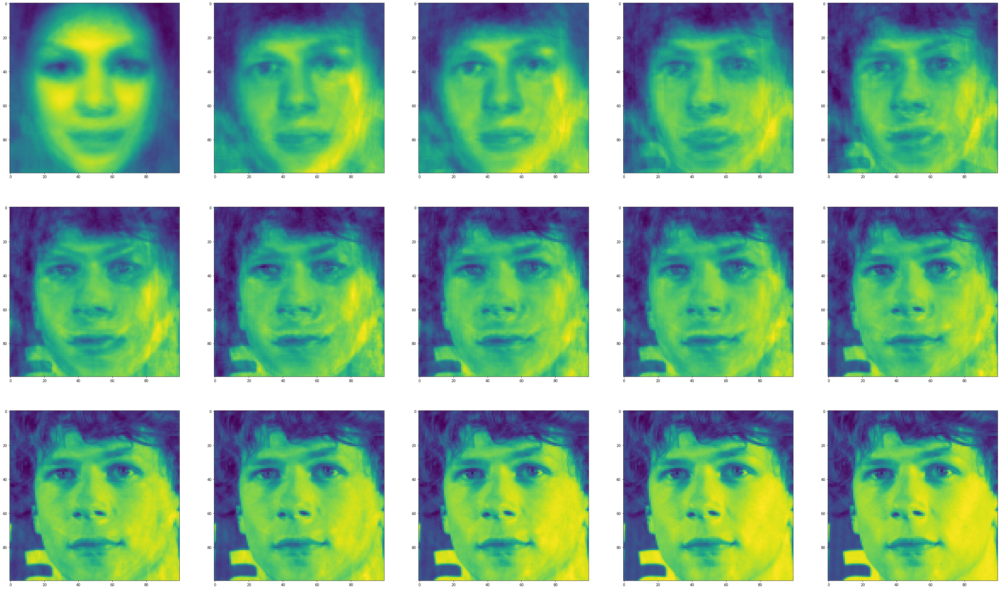

In [30]:
lista = []
for i in range(1,train_x_filtered.shape[0]+1,5):

    obj2 = PCAFeatureExtractor(i,FACE_SIZE)
    x_train_pca2 = obj2(train_x_filtered);
    reconstructed_img = obj2.inverse_transf_plot(x_train_pca2)
    r = np.reshape(reconstructed_img[5,:],FACE_SIZE)
    lista.append(r)
    
plot_image_sequence(lista, n=len(lista), imgs_per_row=5)

### 1.2.5. Eigenface Plots


The 10 eigenfaces contain the most representative features of all the training images, and can be considered as faces with 'standard' attributes. By plotting them all together, it can be observed how the first eigenfaces are more informative than the latter.

Number of eigenfaces: 10


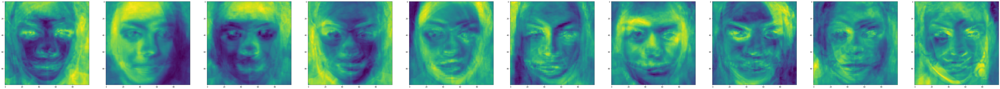

In [31]:
# Extract the eigenfaces
obj.plot_eigenfaces(obj.eigenfaces)

### 1.2.6. Feature Space Plots


**The Feature Space Plot visualizes the face datapoints on the feature space using only the first two principal components.**

In [32]:
# FEATURE SPACE PLOTS: With only 2 Principal Components!!!
x_train = centered_matrix

pca_face_plot = PCA(n_components=2, svd_solver="randomized",whiten=True).fit(x_train)
x_train_plot = pca_face_plot.transform(x_train)

To be able to plot the eigenvectors, the data must be previously converted into integers. This is performed by the **convert_data()** function.

In [33]:
def convert_data(x_data):
    """ Auxiliary function to convert data to integers"""
    list_data = []
    for i in range(x_data.shape[0]):
        img = x_data[i,:]
        img = (img * 1024).astype("int8") + 256
        list_data.append(img)
        
    data = np.array(list_data)
    return data
  
imgs_train = convert_data(x_train_plot)

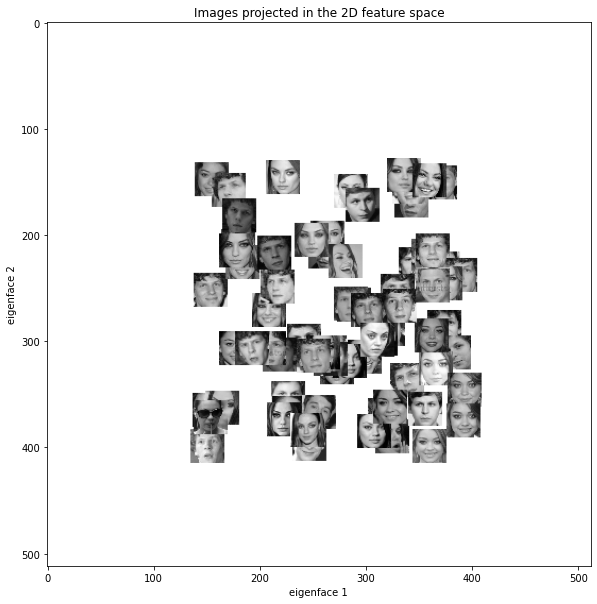

In [34]:
feature_space_plot = np.ones((512,512),dtype=np.uint8)
feature_space_plot.fill(255)

# Retrieve original images
for i in range(matrix.shape[0]):
    img = matrix[i,:]
    img = np.reshape(img,FACE_SIZE)
    h , w = 32, 32 #
    img = cv2.resize(img,(h,w))
    coord_x = imgs_train[i][0]
    coord_y = imgs_train[i][1]
    feature_space_plot[coord_y:coord_y+h, coord_x:coord_x+w] = img

plt.figure(figsize=(10,10))
plt.xlabel("eigenface 1");
plt.ylabel("eigenface 2");
plt.title("Images projected in the 2D feature space")
plt.imshow(feature_space_plot, cmap="gray");

# 2. Evaluation Metrics
## 2.0. Accuracy
Informally, accuracy is the proportion of correct predictions over the total amount of predictions. It is used a lot in classification, although it certainly has its disadvantages as it is not a trustworthy metric when used for evaluating a classifier with the same data that has been used for the training. In order to solve this problem we have developed a function for each classifier that obtains this metric doing a cross-validation. This consists in dividing the data in different sets, using all except for one for the training, and testing the results in the other set. By repeating this procedure with each set and calculating the accuracy as the average of the accuracies obtained in this proccess, we achieve a much more trustworthy estimator.

In the next cell we can see the function that has been included in each classifier:

In [35]:
#def calcAccuracy(self, X, y, percentage):
#        # X contains features for each image: 80 rows (for 80 pictures). Aprox 34000 columns (number of features for each picture)
#        # y contains labels for each image: 80 columns (list)
#        # percentage is the percentage of instances of the data in each set of the cross validation
#        # partition = integer for the number of elements in each set
#        partition = int(len(X) * percentage / 100)
#
#        # save features and labels in data frame.(It is necessary to reshape the y list to 80 rows before)
#        data_frame = np.hstack((X,np.array(y).reshape(len(y),1)))
#
#        # create list to make the partition or sets for cross validation.
#        # Each element of set_features is a set of images with its features
#        # Element i of labels contains a list with the labels of the images contained in the element i of set_features
#        set_features = []
#        set_labels = []
#        for i in range(1, int(100 / percentage) + 1):
#            set_features.append(data_frame[partition * (i - 1):partition * i,:-1])
#            set_labels.append(data_frame[partition * (i - 1): partition * i,-1:].ravel()) 
#        # Accuracies
#        accuracies_crossval = []
#        # In cross validation learn from Data/set i and test in set i
#        for i in range(int(100 / percentage)):#for each set:
#            x_train = []
#            y_train = []
#            for j in range(int(100 / percentage)):# For each set differnt from the test set: create training set for features and labels
#                if (i!=j):
#                    x_train.append(set_features[j])
#                    y_train.append(set_labels[j].reshape(len(set_labels[j]),1))
#            # we get after the for loop a list where each element is a set
#            # so we concatenate and get the training set as the union of the sets (Data / set i)
#            x_train = np.concatenate(x_train)
#            y_train = np.concatenate(y_train)
#            self.classifier.fit(x_train,y_train.ravel())
#            #we test in subset i
#            y_pred = self.classifier.predict(set_features[i])
#            #calculate the accuracy of the prediction tested in the test set (set i) and append it to the corresponding array
#            accuracies_crossval.append(accuracy_score(y_pred,set_labels[i]))
#            #calculate de accuracy as the average accuracy
#        accuracy = np.mean(np.array(accuracies_crossval)) 
#        return accuracy

# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [36]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed 
    during training."""
    
    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y. 

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """
        
        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self
        
    def predict(self, X):
        """Samples labels for the input data. 

        Parameters
        ----------
        X : tensor
            dataset
            
        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)
    
    def __call__(self, X):
        return self.predict(X)
    

## 3.1. Classifier selection

In order to obtain the best results as possible, many types of classifiers have been tried with the features from the feature extractors seen above. This classifiers have been included in classes that have methods for training, predicting and calculating the accuracy with cross-validation as we have explained before.

### 3.1.1. Multilayer Perceptron
This first classifier is a class of feedforward neural network and it has been implemented using the MLPClassifier class from the sklearn library.

In [37]:
#MLP Classifier

class MLPClassificationModel:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier = MLPClassifier(random_state=1, max_iter=650)
    
    def fit(self, X, y):
        self.classifier.fit(X,y)
        return self.classifier
        
    def predict(self, X):
        return self.classifier.predict(X)
    
    def calcAccuracy(self, X, y, percentage):
        # X contains features for each image: n rows (for n pictures). Aprox 34000 columns (number of features for each picture)
        # y contains labels for each image: n columns (list)
        # percentage is the percentage of instances of the data in each set of the cross validation
        # partition = integer for the number of elements in each set
        partition = int(len(X) * percentage / 100)

        # save features and labels in data frame.(It is necessary to reshape the y list to 80 rows before)
        data_frame = np.hstack((X,np.array(y).reshape(len(y),1)))

        # create list to make the partition or sets for cross validation.
        # Each element of set_features is a set of images with its features
        # Element i of labels contains a list with the labels of the images contained in the element i of set_features
        set_features = []
        set_labels = []
        for i in range(1, int(100 / percentage) + 1):
            set_features.append(data_frame[partition * (i - 1):partition * i,:-1])
            set_labels.append(data_frame[partition * (i - 1): partition * i,-1:].ravel()) 
        # Accuracies
        accuracies_crossval = []
        # In cross validation learn from Data/set i and test in set i
        for i in range(int(100 / percentage)):#for each set:
            x_train = []
            y_train = []
            for j in range(int(100 / percentage)):# For each set differnt from the test set: create training set for features and labels
                if (i!=j):
                    x_train.append(set_features[j])
                    y_train.append(set_labels[j].reshape(len(set_labels[j]),1))
            # we get after the for loop a list where each element is a set
            # so we concatenate and get the training set as the union of the sets (Data / set i)
            x_train = np.concatenate(x_train)
            y_train = np.concatenate(y_train)
            self.classifier.fit(x_train,y_train.ravel())
            #we test in subset i
            y_pred = self.classifier.predict(set_features[i])
            #calculate the accuracy of the prediction tested in the test set (set i) and append it to the corresponding array
            accuracies_crossval.append(accuracy_score(y_pred,set_labels[i]))
            #calculate de accuracy as the average accuracy
        accuracy = np.mean(np.array(accuracies_crossval)) 
        return accuracy
    
    def __call__(self, X):
        return self.predict(X)
        


### 3.1.2. Decision Tree


In [38]:
#Tree classifier

class DTClassificationModel:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier = DecisionTreeClassifier(random_state=0)
    
    def fit(self, X, y):
        self.classifier.fit(X,y)
        return self.classifier
        
    def predict(self, X):
        return self.classifier.predict(X)
    
    def calcAccuracy(self, X, y,percentage):
        # X contains features for each image: n rows (for n pictures). Aprox 34000 columns (number of features for each picture)
        # y contains labels for each image: n columns (list)
        # percentage is the percentage of instances of the data in each set of the cross validation
        # partition = integer for the number of elements in each set
        partition = int(len(X) * percentage / 100)

        # save features and labels in data frame.(It is necessary to reshape the y list to 80 rows before)
        data_frame = np.hstack((X,np.array(y).reshape(len(y),1)))

        # create list to make the partition or sets for cross validation.
        # Each element of set_features is a set of images with its features
        # Element i of labels contains a list with the labels of the images contained in the element i of set_features
        set_features = []
        set_labels = []
        for i in range(1, int(100 / percentage) + 1):
            set_features.append(data_frame[partition * (i - 1):partition * i,:-1])
            set_labels.append(data_frame[partition * (i - 1): partition * i,-1:].ravel()) 
        # Accuracies
        accuracies_crossval = []
        # In cross validation learn from Data/set i and test in set i
        for i in range(int(100 / percentage)):#for each set:
            x_train = []
            y_train = []
            for j in range(int(100 / percentage)):# For each set differnt from the test set: create training set for features and labels
                if (i!=j):
                    x_train.append(set_features[j])
                    y_train.append(set_labels[j].reshape(len(set_labels[j]),1))
            # we get after the for loop a list where each element is a set
            # so we concatenate and get the training set as the union of the sets (Data / set i)
            x_train = np.concatenate(x_train)
            y_train = np.concatenate(y_train)
            self.classifier.fit(x_train,y_train.ravel())
            #we test in subset i
            y_pred = self.classifier.predict(set_features[i])
            #calculate the accuracy of the prediction tested in the test set (set i) and append it to the corresponding array
            accuracies_crossval.append(accuracy_score(y_pred,set_labels[i]))
            #calculate de accuracy as the average accuracy
        accuracy = np.mean(np.array(accuracies_crossval)) 
        return accuracy
    def __call__(self, X):
        return self.predict(X)
        

### 3.1.3. K Nearest Neighbours (KNN)

In [39]:
# K nearest neighbours classifier

class KNNClassificationModel:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier = KNeighborsClassifier(n_neighbors=2)
    
    def fit(self, X, y):
        self.classifier.fit(X,y)
        return self.classifier
        
    def predict(self, X):
        return self.classifier.predict(X)
    
    def calcAccuracy(self, X, y,percentage):
        # X contains features for each image: n rows (for n pictures). Aprox 34000 columns (number of features for each picture)
        # y contains labels for each image: n columns (list)
        # percentage is the percentage of instances of the data in each set of the cross validation
        # partition = integer for the number of elements in each set
        partition = int(len(X) * percentage / 100)

        # save features and labels in data frame.(It is necessary to reshape the y list to 80 rows before)
        data_frame = np.hstack((X,np.array(y).reshape(len(y),1)))

        # create list to make the partition or sets for cross validation.
        # Each element of set_features is a set of images with its features
        # Element i of labels contains a list with the labels of the images contained in the element i of set_features
        set_features = []
        set_labels = []
        for i in range(1, int(100 / percentage) + 1):
            set_features.append(data_frame[partition * (i - 1):partition * i,:-1])
            set_labels.append(data_frame[partition * (i - 1): partition * i,-1:].ravel()) 
        # Accuracies
        accuracies_crossval = []
        # In cross validation learn from Data/set i and test in set i
        for i in range(int(100 / percentage)):#for each set:
            x_train = []
            y_train = []
            for j in range(int(100 / percentage)):# For each set differnt from the test set: create training set for features and labels
                if (i!=j):
                    x_train.append(set_features[j])
                    y_train.append(set_labels[j].reshape(len(set_labels[j]),1))
            # we get after the for loop a list where each element is a set
            # so we concatenate and get the training set as the union of the sets (Data / set i)
            x_train = np.concatenate(x_train)
            y_train = np.concatenate(y_train)
            self.classifier.fit(x_train,y_train.ravel())
            #we test in subset i
            y_pred = self.classifier.predict(set_features[i])
            #calculate the accuracy of the prediction tested in the test set (set i) and append it to the corresponding array
            accuracies_crossval.append(accuracy_score(y_pred,set_labels[i]))
            #calculate de accuracy as the average accuracy
        accuracy = np.mean(np.array(accuracies_crossval)) 
        return accuracy
    def __call__(self, X):
        return self.predict(X)
    

### 3.1.4. Support Vector Machine (SVM)

In [40]:
#SVM Classifier

class SVMModel:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier = svm.LinearSVC()
    
    def fit(self, X, y):
        self.classifier.fit(X,y)
        return self.classifier
        
    def predict(self, X):
        return self.classifier.predict(X)
    
    def calcAccuracy(self, X, y, percentage):
        # X contains features for each image: n rows (for n pictures). Aprox 34000 columns (number of features for each picture)
        # y contains labels for each image: n columns (list)
        # percentage is the percentage of instances of the data in each set of the cross validation
        # partition = integer for the number of elements in each set
        partition = int(len(X) * percentage / 100)

        # save features and labels in data frame.(It is necessary to reshape the y list to 80 rows before)
        data_frame = np.hstack((X,np.array(y).reshape(len(y),1)))
# create list to make the partition or sets for cross validation.
        # Each element of set_features is a set of images with its features
        # Element i of labels contains a list with the labels of the images contained in the element i of set_features
        set_features = []
        set_labels = []
        for i in range(1, int(100 / percentage) + 1):
            set_features.append(data_frame[partition * (i - 1):partition * i,:-1])
            set_labels.append(data_frame[partition * (i - 1): partition * i,-1:].ravel()) 
        # Accuracies
        accuracies_crossval = []
        # In cross validation learn from Data/set i and test in set i
        for i in range(int(100 / percentage)):#for each set:
            x_train = []
            y_train = []
            for j in range(int(100 / percentage)):# For each set differnt from the test set: create training set for features and labels
                if (i!=j):
                    x_train.append(set_features[j])
                    y_train.append(set_labels[j].reshape(len(set_labels[j]),1))
            # we get after the for loop a list where each element is a set
            # so we concatenate and get the training set as the union of the sets (Data / set i)
            x_train = np.concatenate(x_train)
            y_train = np.concatenate(y_train)
            self.classifier.fit(x_train,y_train.ravel())
            #we test in subset i
            y_pred = self.classifier.predict(set_features[i])
            #calculate the accuracy of the prediction tested in the test set (set i) and append it to the corresponding array
            accuracies_crossval.append(accuracy_score(y_pred,set_labels[i]))
            #calculate de accuracy as the average accuracy
        accuracy = np.mean(np.array(accuracies_crossval)) 
        return accuracy
    def __call__(self, X):
        return self.predict(X)
        


### 3.1.5. Combining SVM, KNN and MLP

In this section we try to combine the SVM, KNN and MLP classifiers aiming for a better performance of the system. First we create the three classifiers and compare their predictions:
- If the 3 classifiers agree in the prediction, then we use this value.
- If the 3 of them disagree, we chose the prediction of the MLP classifier, the one with the best performance in the test set.
- If only 2 of them agree, we use as prediction the value in which these 2 agree.

In [41]:
def all_equal(a,b,c):
    if (a == b and b == c and a == c):
        return True
    else:
        return False

def all_different(a, b, c):
    if (a != b and b != c and a != c):
        return True
    else:
        return False
def return_equals(a, b, c):
    if (a == b or a == c):
        return a
    else:
        return b

In [42]:
class CombClassifiers:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier1 = MLPClassifier(random_state=1, max_iter=600)
        self.classifier2 = KNeighborsClassifier(n_neighbors=2)
        self.classifier3 = svm.LinearSVC()
        
    
    def fit(self, X, y):
        self.classifier1.fit(X,y)
        self.classifier2.fit(X,y)
        self.classifier3.fit(X,y)
        return
        
    def predict(self, X):
        prediction = []
        pred1 = self.classifier1.predict(X)
        pred2 = self.classifier2.predict(X)
        pred3 = self.classifier3.predict(X)
        
        for i in range(pred1.shape[0]):
            if (all_equal(pred1[i], pred2[i], pred3[i])):#if classifiers agree
                prediction.append(pred1[i])#append prediction of MLP (predictions of the three classifiers are the same)
            elif (all_different(pred1[i], pred2[i], pred3[i])): #if all classifiers disagree
                prediction.append(pred1[i]) #append prediction of MLP (best performance)
            else: #if only one disagree take prediction of the two that agree
                prediction.append(return_equals(pred1[i], pred2[i], pred3[i]))#we take the two predictions that agree
        prediction = np.array(prediction)
        return prediction
    
    def __call__(self, X):
        return self.predict(X)
        

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>

A pipeline is a combination of a feature extractor and a classifier: with the feature extractor we obtain the most important attributes from the images which will be used for training the classifier. In this section we will explore different combinations in order to obtain the best results for the competition.

## 4.0. Example: basic pipeline
The basic pipeline takes any input and samples a label based on the class label distribution of the training set. As expected the performance is very poor, predicting approximately 1/4 correctly on the training set. There is a lot of room for improvement but this is left to you ;). 

In [43]:
#feature_extractor = IdentityFeatureExtractor() 
#classifier = RandomClassificationModel()
#
## train the model on the features
#classifier.fit(feature_extractor(train_x_filtered), train_y_filtered)
#
## model/final pipeline
#model = lambda X: classifier(feature_extractor(X))

## 4.1. Trying pipelines
Now that we have defined our feature extractors and our classifier, it is time we test which one of them gets the best results. In order to do that, we will calculate the accuracy with the cross-validation function we developed for every combination of feature extractor and classifier.

### 4.1.1. Multilayer Perceptron

In [44]:
classifier = MLPClassificationModel()

acc_handcrafted = classifier.calcAccuracy(testDataHOG.hogFeatures, train_y_filtered, 10)
acc_non_handcrafted = classifier.calcAccuracy(x_train_pca, train_y_filtered, 10)

print("The accuracy with handcrafted features is: ", acc_handcrafted)
print("The accuracy with non-handcrafted features is: ", acc_non_handcrafted)


The accuracy with handcrafted features is:  0.6142857142857142
The accuracy with non-handcrafted features is:  0.6428571428571428


### 4.1.2. Decision tree

In [45]:
DT = DTClassificationModel()

acc_handcrafted = DT.calcAccuracy(testDataHOG.hogFeatures, train_y_filtered, 10)
acc_non_handcrafted = DT.calcAccuracy(x_train_pca, train_y_filtered, 10)

print("The accuracy with handcrafted features is: ", acc_handcrafted)
print("The accuracy with non-handcrafted features is: ", acc_non_handcrafted)

The accuracy with handcrafted features is:  0.4714285714285714
The accuracy with non-handcrafted features is:  0.6142857142857142


### 4.1.3. K Nearest Neighbours (KNN)

In [46]:
KNN = KNNClassificationModel()

acc_handcrafted = KNN.calcAccuracy(testDataHOG.hogFeatures, train_y_filtered, 10)
acc_non_handcrafted = KNN.calcAccuracy(x_train_pca, train_y_filtered, 10)

print("The accuracy with handcrafted features is: ", acc_handcrafted)
print("The accuracy with non-handcrafted features is: ", acc_non_handcrafted)

The accuracy with handcrafted features is:  0.7714285714285715
The accuracy with non-handcrafted features is:  0.6428571428571429


### 4.1.4. Support Vector Machine (SVM)

In [47]:
classifier = SVMModel()

acc_handcrafted = classifier.calcAccuracy(testDataHOG.hogFeatures, train_y_filtered, 10)
acc_non_handcrafted = classifier.calcAccuracy(x_train_pca, train_y_filtered, 10)

print("The accuracy with handcrafted features is: ", acc_handcrafted)
print("The accuracy with non-handcrafted features is: ", acc_non_handcrafted)

The accuracy with handcrafted features is:  0.8142857142857143
The accuracy with non-handcrafted features is:  0.7142857142857142


### 4.1.5. Conclusions
We can see from the results that the estimators differ from how the features has been obtained: HOG or PCA.

**Multilayer Perceptron**

The accuracy with handcrafted features is:  0.7

The accuracy with non-handcrafted features is:  0.7285714285714284


**Decision tree**

The accuracy with handcrafted features is:  0.5142857142857142

The accuracy with non-handcrafted features is:  0.6142857142857142


**K Nearest Neighbours**

The accuracy with handcrafted features is:  0.7428571428571428

The accuracy with non-handcrafted features is:  0.5857142857142856


**Support Vector Machine**

The accuracy with handcrafted features is:  0.7999999999999999

The accuracy with non-handcrafted features is:  0.6714285714285714


**To sum up**

As it was said before, HOG features are extrated from regions that have no edges so depending on the classifier which is used, they will have higher or lower accuracy than PCA.

K Nearest Neighbours and Support Vector Machine have higher acurracy when HOG is applied whereas Multilayer Perceptron and Decision Trees have a better performance when PCA is used.


## 4.2. Selecting the best pipelines
Once we have calculated an estimator for the accuracy, we will try the best pipelines on the test data by making a submission.
From the previous section we have estimators of the accuracies of the 

In [48]:
#Selecting the Feature Extractor: uncomment the one you want to use

feature_extractor = HOGFeatureExtractor() 
#feature_extractor = PCAFeatureExtractor(15,FACE_SIZE)

#Selecting the Classifier: uncomment the one you want to use

classifier = MLPClassificationModel()
#classifier = DTClassificationModel()
#classifier = KNNClassificationModel()
#classifier = SVMModel()
#classifier = CombClassifiers()

# train the model on the features
classifier.fit(feature_extractor(train_x_filtered), train_y_filtered)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

In [49]:
# evaluate performance of the model on the training set

train_y_star = model(train_x_filtered)


"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    classifier.calcAccuracy(feature_extractor(train_x_filtered), train_y_filtered,10))

'The performance on the training set is 0.61. This however, does not tell us much about the actual performance (generalisability).'

In [50]:
# predict the labels for the test set 
test_y_star = model(test_X)

## 4.3. Preprocessing improvements

### 4.3.1. Filtering the images
As we have explained above, the images that do not represent the faces correctly have been removed by using the standard deviation to use a filter. This has increased the obtained accuracy approximately in a 5% as the data we use to train our network is more reliable. Also, the images in the training set missclassified as Jesse has been removed manually.

### 4.3.2. Data augmentation
We have also tried this technique that generates more data to use for the training process of our classifier. The main goal of this technique is to make the model generalize better and improve regularization by offering slightly different examples to train to it (i.e., creates new data from the original existing training dataset). In this context, online data augmentation and offline data augmentation are the two possible options to perform. 
Online data augmentation consists of real-time data augmentation, which refers to perform random transformations on the data and train the model with these randomly transformed examples on the fly. Nevertheless, we have decided to perform offline data augmentation, which on the contrary consists of generating a new dataset with the augmented images, which are obtained after transforming every and each of the original training images. This leads to a bigger training dataset and may cause longer training times since we have now more images to train with, but at the end it has the goal of making the model more robust.

This is done by rotating and horizontally flipping the images and appending them in the faces vector with their original label. These are two of the most common transformations in the data augmentation context, but many more could have been tested (vertical flipping, shearing, contrast changes, adding white gaussian noise...). Even though this seems like a useful technique that usually gives better results, we do not have improved our results using this technique. That is the reason why it has not been included in the preprocessing at the beggining of this notebook.

In [51]:
train_X_flipped = []
train_X_rotated = []
all_train = []
all_labels = []
for i in range(train_X.shape[0]):
    # Flipping horizontally
    image = train_X[i]
    label = train_y[i]
    flipped = tf.image.flip_left_right(image)
    n_times_rotated = np.random.randint(1,4) #90, 180 or 270 degrees
    rotated = np.rot90(image,n_times_rotated,axes=(0,1))
    
    all_train.append(image)
    all_train.append(rotated)
    all_train.append(flipped)
    all_labels.append(label)
    all_labels.append(label)
    all_labels.append(label)
    train_X_rotated.append(rotated)
    train_X_flipped.append(flipped)
    
train_X_rotated = np.array(train_X_rotated)
train_X_flipped = np.array(train_X_flipped)
all_train = np.array(all_train)
all_labels = np.array(all_labels)
train_y_labels = np.concatenate((train_y, train_y, train_y), axis=None)

2022-04-12 20:09:14.233594: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-12 20:09:14.322915: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-12 20:09:14.324036: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-12 20:09:14.329200: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

By running the next code we can observe the original face image and the two other variations that have been created.

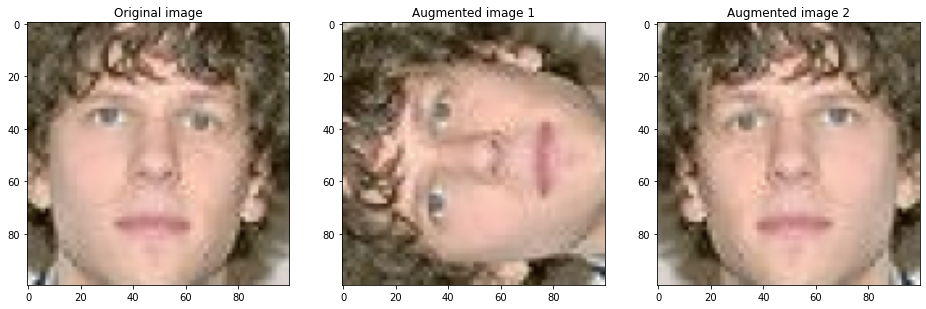

In [52]:
def visualize(original, augmented1, augmented2):
    fig = plt.figure(figsize=(16, 16))
    plt.subplot(1,3,1)
    plt.title('Original image')
    plt.imshow(original)

    plt.subplot(1,3,2)
    plt.title('Augmented image 1')
    plt.imshow(augmented1)
    
    plt.subplot(1,3,3)
    plt.title('Augmented image 2')
    plt.imshow(augmented2)
    
n = np.random.randint(len(train_X_flipped))
visualize(train_X[n], train_X_rotated[n], train_X_flipped[n])

# 5. Publishing best results

In [53]:
submission = test.copy().drop('img', axis = 1)
test_y_star = test_y_star.astype(int)
submission['class'] = test_y_star

submission

,class
id,
0,1
1,0
2,0
3,0
4,1
...,...
1811,0
1812,0
1813,1


In [54]:
submission.to_csv('submission.csv')

# 6. Discussion




**Histogram of Oriented Gradient: HOG**: As it has been discused during the notebook, HOG is a feature descriptor that uses the orientation and the gradient of the pixels of the object in order to save the nedeed information in the most compact form.

**Principal Component Analysis (PCA)**: It tries to do exactly the same as the HOG but it works in a different way. The main idea is to obtain the features and then attempt to reduce the amount of them without losing information. It works in such a way that transforms the features into "weights" in order to represent the images in a simpler way. Depending on the amount of components selected, the objective is to find the ideal amount of them making it faster without losing information.
Each image is represented by these "weights" and they are related with the eigenfaces (faces that do not exist but represent the data set). For that, the original face is composed by the eigenfaces multiplied by each weight.


As it was mentioned before, the estimators show us that depending on what classifier we use, we achieve better results in the training set with handcrafted features or with non handcrafted features. However, in the test set this changes, and the best scores are always achieved with handcrafted features.

Severals combinations between classifiers and features were tried, achieving the highest score combining a multilayer perceptron classifier with handcrafted features. 

Trying to improve the results complementary technics such as data augmentation or the combination of three classifiers were tried unsuccessfully. Also the extraction of the HOG features was done from the images in grayscale, leading this to a reduction of the accuracy in the test set. 

A great improvement of the results was reached by filtering the missclassified images in the training set: 
- First removing from the training set the images with really low standard deviation where there were no faces at all
- Secondly removing manually from de training set 3 pictures missclassified as Jesse that actually belonged to class 0.

We strongly believe that the two things that determine the accuracy of the model are firstly the quality of the data, which is solved by data cleaning and pre-processing, and secondly the classifier we use. That is why we believe that perhaps with a deep neural network we would probably achieve higher prediction accuracies on the test set than with the simpler conventional classifiers that we use here, such as MLP or KNN.